In [1]:
from IPython.display import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft2, ifft2, fftshift

# Filtering

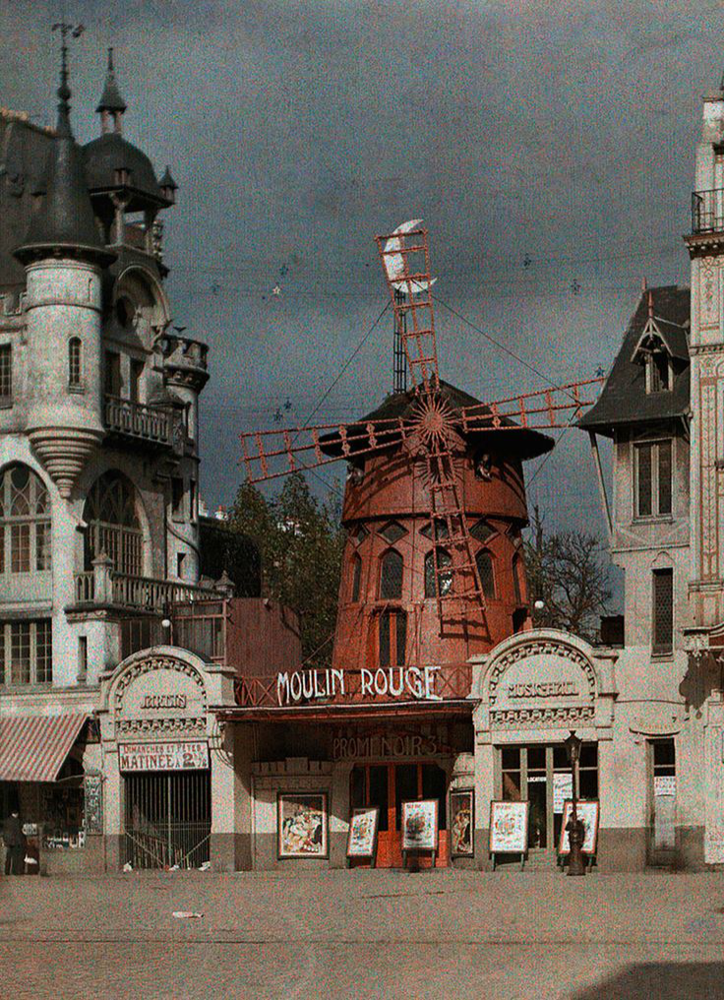

In [2]:
Image(filename='image/d (1).png')

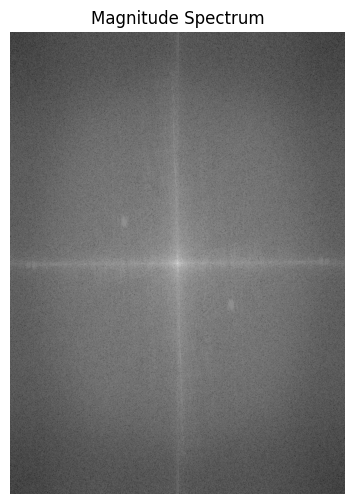

In [3]:
def compute_magnitude_spectrum(img_array):
    dft = fft2(img_array)
    dft_shift = fftshift(dft)
    return np.log(1 + np.abs(dft_shift))

image_path = 'image/d (1).png'
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

magnitude_spectrum = compute_magnitude_spectrum(img_gray)

plt.figure(figsize=(6, 6))
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum')
plt.axis('off')
plt.show()

Magnitude spectrum ini menunjukkan garis terang horizontal dan vertikal di tengah, menandakan dominasi frekuensi rendah yang terkait dengan kontur gambar. Pusat terang menunjukkan frekuensi terendah mendominasi, mewakili perubahan intensitas yang lambat. Bintik-bintik redup di sekitar garis utama menandakan adanya noise atau komponen frekuensi tinggi. Komponen frekuensi tinggi berada di tepi gambar, tetapi tidak terlalu dominan, menunjukkan gambar asli memiliki detail halus yang terbatas.

Sehingga, dapat dilakukan filtering untuk mengurangi noise yang terlihat pada gambar, memperhalus area yang kurang rapi, dan meningkatkan kualitas visual agar gambar lebih jelas dan nyaman untuk dilihat.

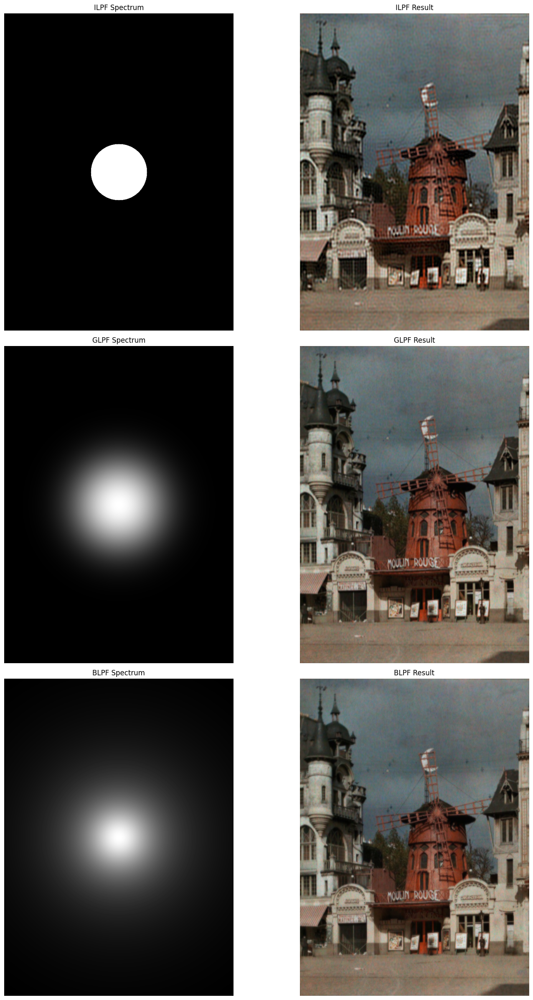

In [4]:
def low_pass_filter(img_array, filter_type, cutoff, order=0.5):
    dft = fft2(img_array)
    dft_shift = fftshift(dft)
    
    rows, cols = img_array.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols), np.float32)
    
    for i in range(rows):
        for j in range(cols):
            distance = np.sqrt((i - crow) ** 2 + (j - ccol) ** 2)
            if filter_type == 'ILPF':
                mask[i, j] = 1 if distance <= cutoff else 0
            elif filter_type == 'BLPF':
                mask[i, j] = 1 / (1 + (distance / cutoff) ** (2 * order))
            elif filter_type == 'GLPF':
                mask[i, j] = np.exp(- (distance ** 2) / (2 * (cutoff ** 2)))
    
    dft_shift_filtered = dft_shift * mask
    f_ishift = np.fft.ifftshift(dft_shift_filtered)
    img_back = ifft2(f_ishift)
    return np.abs(img_back), mask

higher_cutoff_ILPF = 90
higher_cutoff_GLPF = 90
higher_cutoff_BLPF = 90

def apply_filter_to_color_image(img_array, filter_type, cutoff, order=1):
    filtered_channels = []
    masks = []
    for channel in range(3):
        filtered_channel, mask = low_pass_filter(img_array[:, :, channel], filter_type, cutoff, order)
        filtered_channels.append(filtered_channel)
        masks.append(mask)
    
    filtered_img = np.stack(filtered_channels, axis=-1).astype(np.uint8)
    return filtered_img, masks

image_path = 'image/d (1).png'
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_ILPF, masks_ILPF = apply_filter_to_color_image(img, 'ILPF', higher_cutoff_ILPF)
img_BLPF, masks_BLPF = apply_filter_to_color_image(img, 'BLPF', higher_cutoff_BLPF)
img_GLPF, masks_GLPF = apply_filter_to_color_image(img, 'GLPF', higher_cutoff_GLPF)

plt.figure(figsize=(16, 24))

plt.subplot(3, 2, 1)
plt.imshow(np.log(1 + np.abs(masks_ILPF[0])), cmap='gray')
plt.title('ILPF Spectrum')
plt.axis('off')

plt.subplot(3, 2, 2)
plt.imshow(img_ILPF)
plt.title('ILPF Result')
plt.axis('off')

plt.subplot(3, 2, 3)
plt.imshow(np.log(1 + np.abs(masks_GLPF[0])), cmap='gray')
plt.title('GLPF Spectrum')
plt.axis('off')

plt.subplot(3, 2, 4)
plt.imshow(img_GLPF)
plt.title('GLPF Result')
plt.axis('off')

plt.subplot(3, 2, 5)
plt.imshow(np.log(1 + np.abs(masks_BLPF[0])), cmap='gray')
plt.title('BLPF Spectrum')
plt.axis('off')

plt.subplot(3, 2, 6)
plt.imshow(img_BLPF)
plt.title('BLPF Result')
plt.axis('off')

plt.tight_layout()
plt.show()


| **Filter Type**             | **Spektrum**                                                                                  | **Hasil Gambar**                                                                                                                          | **Keterangan**                                                                                                                                         |
|-----------------------------|-----------------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------------------------------------------------------------|--------------------------------------------------------------------------------------------------------------------------------------------------------|
| **ILPF (Ideal Low Pass Filter)**     | Spektrum menampilkan lingkaran tajam. Frekuensi rendah di dalam lingkaran dipertahankan, frekuensi tinggi di luar dihilangkan. | Gambar menunjukkan smoothing yang signifikan, tetapi sering muncul artefak seperti **ringing** pada beberapa area gambar.                                | ILPF memberikan transisi yang sangat tajam antara frekuensi, menghasilkan gambar yang halus, namun menyebabkan artefak dan hilangnya beberapa detail.    |
| **GLPF (Gaussian Low Pass Filter)**  | Spektrum menunjukkan transisi yang sangat lembut dan gradual.                                                              | Gambar dihasilkan dengan smoothing yang sangat halus, tetapi beberapa detail penting mungkin hilang sehingga gambar bisa terlihat lebih soft.            | GLPF memberikan hasil smoothing yang sangat natural, namun terkadang berlebihan sehingga menyebabkan hilangnya beberapa detail penting pada gambar.     |
| **BLPF (Butterworth Low Pass Filter)** | Spektrum menunjukkan transisi yang lebih gradual dibanding ILPF, tetapi tidak sehalus GLPF.                               | Gambar menunjukkan keseimbangan antara smoothing dan detail, dengan hasil yang lebih jernih dan minim artefak ringing dibanding ILPF.                    | BLPF sering kali dianggap lebih baik dalam menjaga keseimbangan antara smoothing dan mempertahankan detail gambar, menjadikannya lebih jernih daripada GLPF. |

## Result

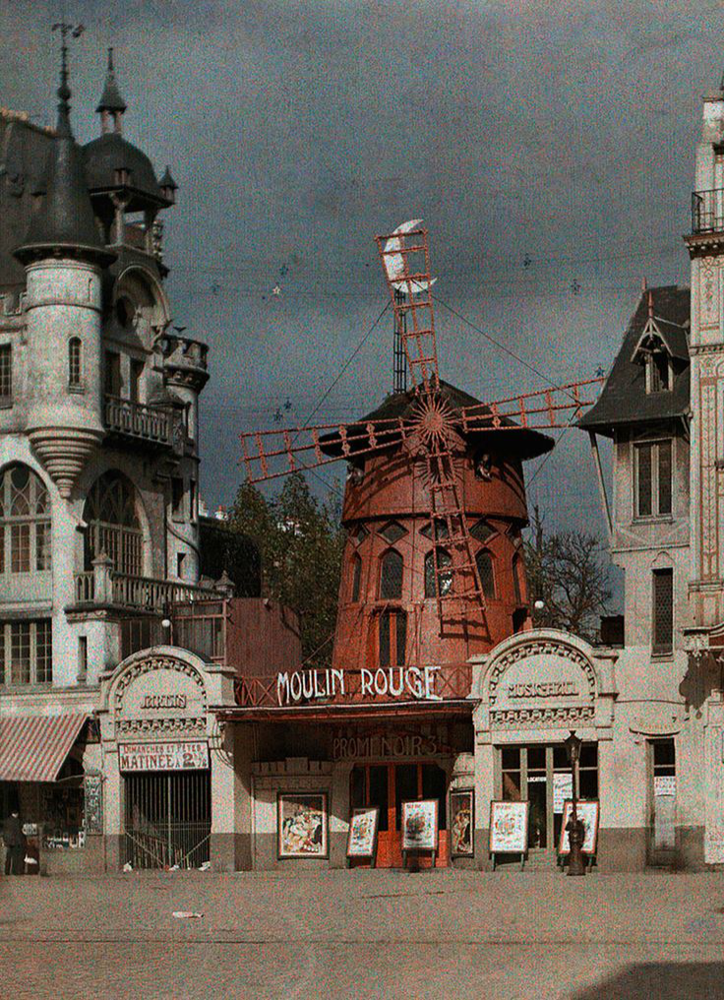

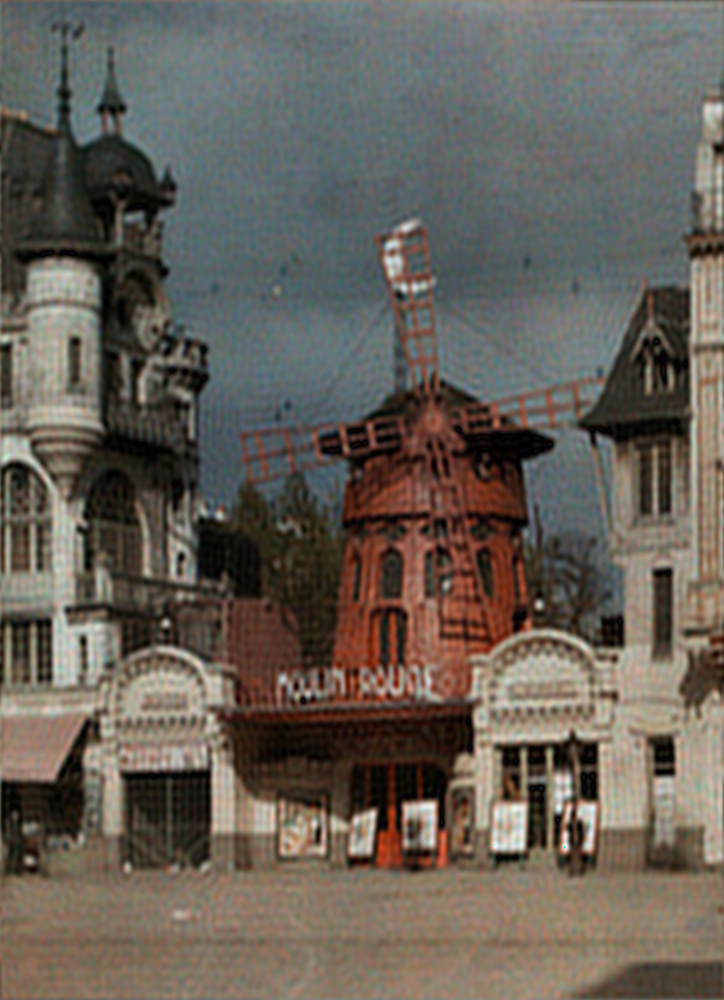

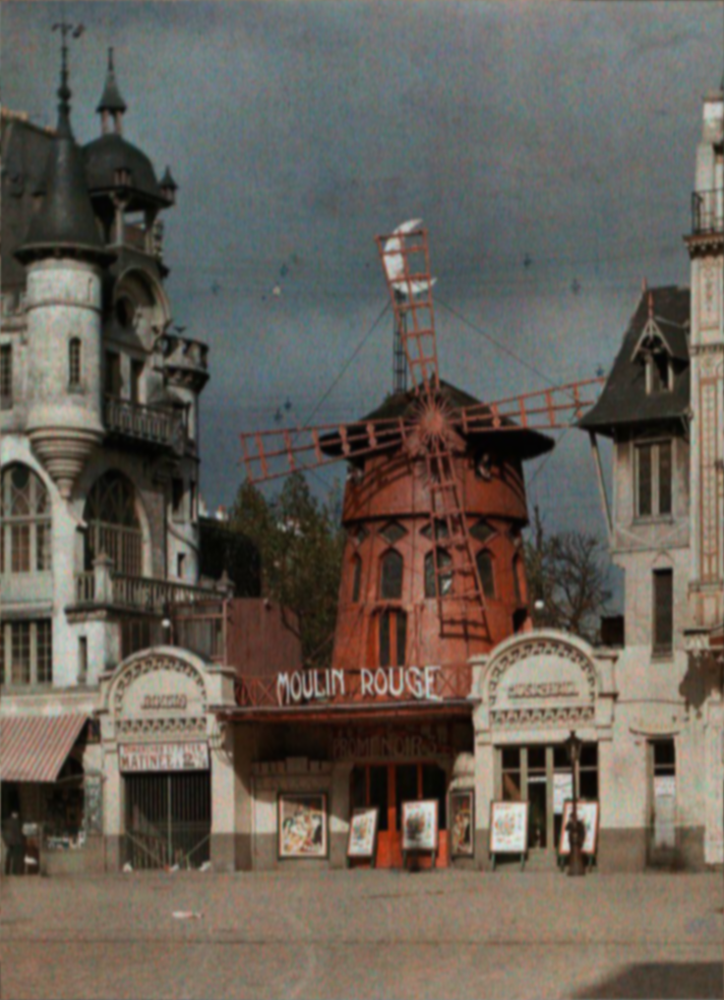

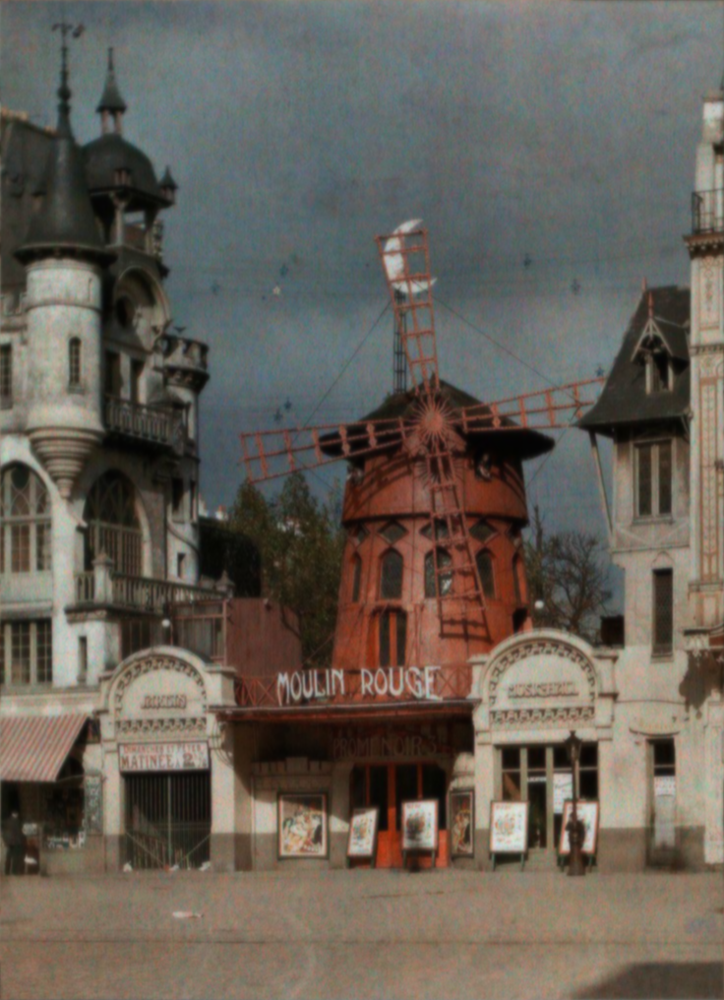

In [5]:
cv2.imwrite('result//img_ILPF.png', cv2.cvtColor(img_ILPF, cv2.COLOR_RGB2BGR))
cv2.imwrite('result//img_GLPF.png', cv2.cvtColor(img_GLPF, cv2.COLOR_RGB2BGR))
cv2.imwrite('result//img_BLPF.png', cv2.cvtColor(img_BLPF, cv2.COLOR_RGB2BGR))

display(Image(filename='image/d (1).png'))
display(Image(filename='result//img_ILPF.png'))
display(Image(filename='result//img_GLPF.png'))
display(Image(filename='result//img_BLPF.png'))

# Notch Reject Filter

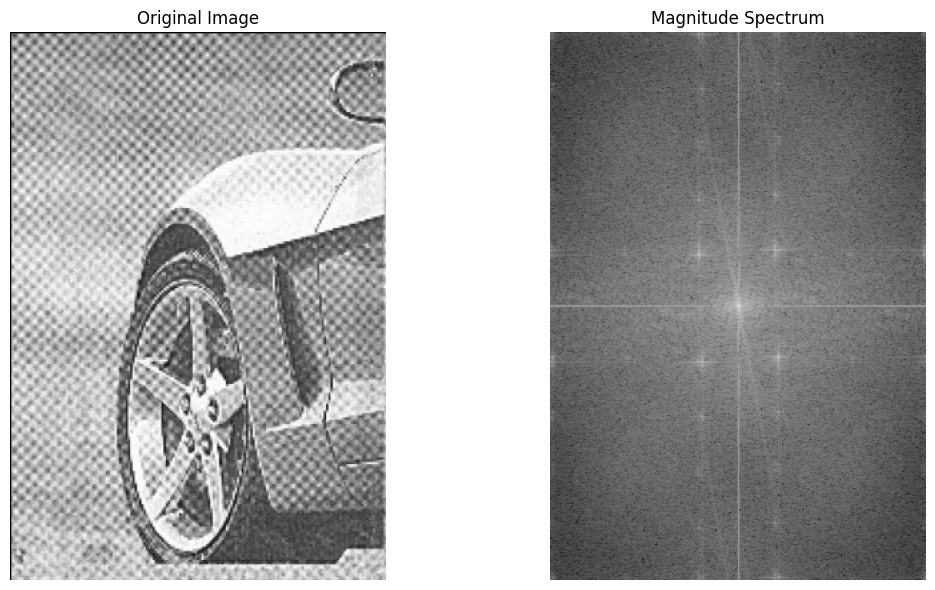

In [6]:
img = cv2.imread('Image\\hiIzt.png', 0)

f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift))

plt.figure(figsize=(12, 6))

plt.subplot(121)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum')
plt.axis('off')

plt.tight_layout()
plt.show()

In [7]:
def notch_reject_filter(shape, d0, u_k, v_k):
    P, Q = shape
    H = np.ones((P, Q))
    for u in range(P):
        for v in range(Q):
            D_uv = np.sqrt((u - P / 2 + u_k) ** 2 + (v - Q / 2 + v_k) ** 2)
            D_muv = np.sqrt((u - P / 2 - u_k) ** 2 + (v - Q / 2 - v_k) ** 2)
            if D_uv <= d0 or D_muv <= d0:
                H[u, v] = 0.0
    return H

def butterworth_notch_reject_filter(shape, d0, u_k, v_k, n):
    P, Q = shape
    H = np.ones((P, Q))
    for u in range(P):
        for v in range(Q):
            D_uv = np.sqrt((u - P / 2 + u_k) ** 2 + (v - Q / 2 + v_k) ** 2)
            D_muv = np.sqrt((u - P / 2 - u_k) ** 2 + (v - Q / 2 - v_k) ** 2)
            H[u, v] = 1 / (1 + (d0 / (D_uv + 1e-5)) ** (2 * n)) * 1 / (1 + (d0 / (D_muv + 1e-5)) ** (2 * n))
    return H

notch_params = [
    (10, 38, 30),
    (10, -42, 27),
    (10, 80, 30),
    (10, -82, 28),
    (10, 120, 30),
    (10, -120, 30),
    (10, 160, 30),
    (10, -160, 30),
    (10, 200, 30),
    (10, -200, 30),
]

butterworth_params = [
    (10, 38, 30, 1),
    (10, -42, 27, 1),
    (10, 80, 30, 1),
    (10, -82, 28, 1),
    (10, 120, 30, 1),
    (10, -120, 30, 1),
    (10, 160, 30, 1),
    (10, -160, 30, 1),
    (10, 200, 30, 1),
    (10, -200, 30, 1),
]

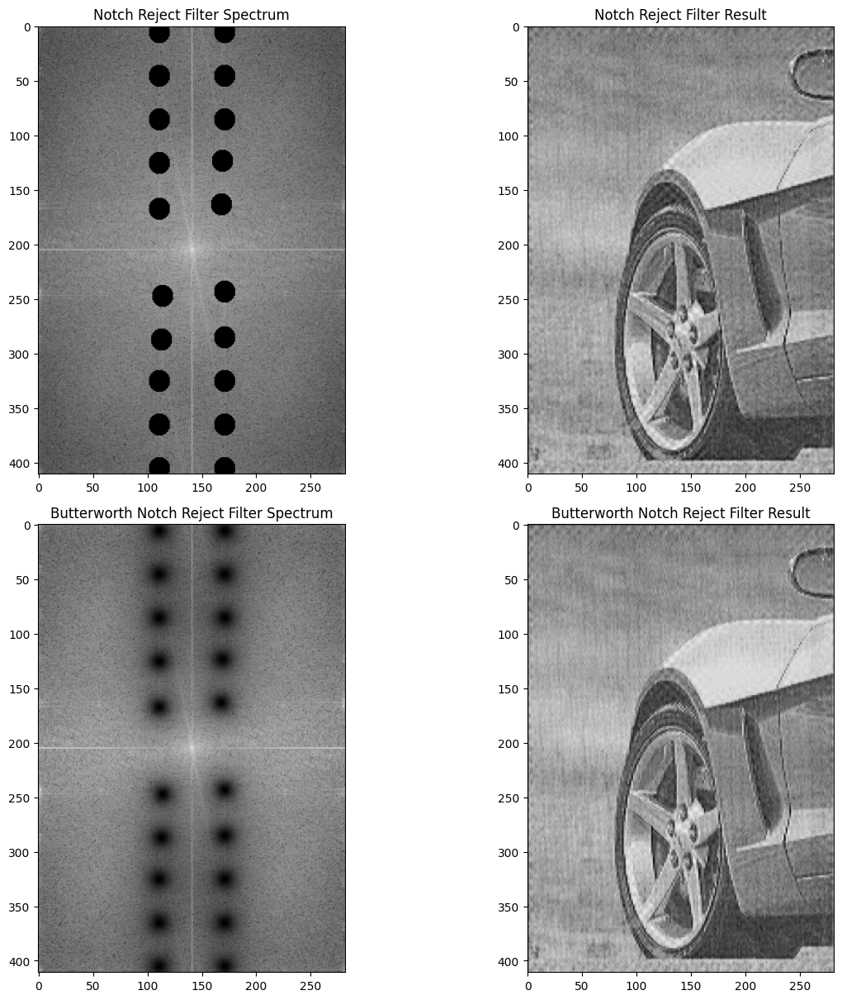

In [8]:
img_shape = img.shape

NotchFilter = np.ones(img_shape)
for params in notch_params:
    d0, u_k, v_k = params
    NotchFilter *= notch_reject_filter(img_shape, d0, u_k, v_k)

NotchRejectCenter = fshift * NotchFilter
NotchReject = np.fft.ifftshift(NotchRejectCenter)
inverse_NotchReject = np.fft.ifft2(NotchReject)
NotchRejectResult = np.abs(inverse_NotchReject)

ButterworthFilter = np.ones(img_shape)
for params in butterworth_params:
    d0, u_k, v_k, n = params
    ButterworthFilter *= butterworth_notch_reject_filter(img_shape, d0, u_k, v_k, n)

ButterworthRejectCenter = fshift * ButterworthFilter
ButterworthReject = np.fft.ifftshift(ButterworthRejectCenter)
inverse_ButterworthReject = np.fft.ifft2(ButterworthReject)
ButterworthRejectResult = np.abs(inverse_ButterworthReject)

plt.figure(figsize=(12, 18))

plt.subplot(321)
plt.imshow(magnitude_spectrum * NotchFilter, cmap='gray')
plt.title('Notch Reject Filter Spectrum')

plt.subplot(322)
plt.imshow(NotchRejectResult, cmap='gray')
plt.title("Notch Reject Filter Result")

plt.subplot(323)
plt.imshow(magnitude_spectrum * ButterworthFilter, cmap='gray')
plt.title("Butterworth Notch Reject Filter Spectrum")

plt.subplot(324)
plt.imshow(ButterworthRejectResult, cmap='gray')
plt.title("Butterworth Notch Reject Filter Result")

plt.tight_layout()
plt.show()

| **Jenis**                            | **Penjelasan Spektrum**                                                                                                                                                                    | **Deskripsi**                                                                                                                                                                                |
|--------------------------------------|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Notch Reject Filter**              | Spektrum menunjukkan beberapa titik hitam pada garis horizontal dan vertikal, yang mengindikasikan frekuensi yang telah diblokir secara tajam oleh filter.                                   | Gambar hasil setelah filter menunjukkan noise yang berkurang terutama pada area dengan detail tajam seperti roda mobil. Filter ini lebih tajam dan dapat menyebabkan sedikit artefak.        |
| **Butterworth Notch Reject Filter**  | Spektrum menunjukkan titik hitam yang lebih kabur dibandingkan Notch Reject Filter, yang menandakan transisi frekuensi yang lebih halus dan lembut pada frekuensi yang diblokir.              | Hasil filter menunjukkan pengurangan noise yang lebih halus, menghasilkan gambar yang lebih natural, meskipun beberapa detail halus tetap terlihat. Filter ini lebih lembut dan minim artefak. |


## Result

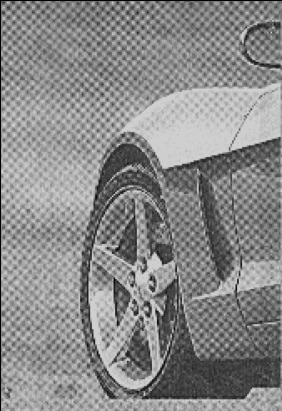

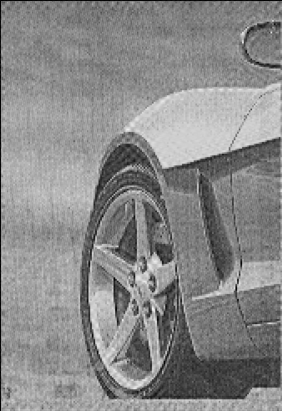

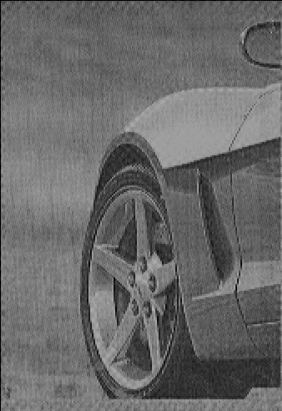

In [9]:
display(Image(filename='Image\\hiIzt.png'))
cv2.imwrite('result/NotchRejectResult.png', NotchRejectResult)
cv2.imwrite('result/ButterworthRejectResult.png', ButterworthRejectResult)
display(Image(filename='result/NotchRejectResult.png'))
display(Image(filename='result/ButterworthRejectResult.png'))

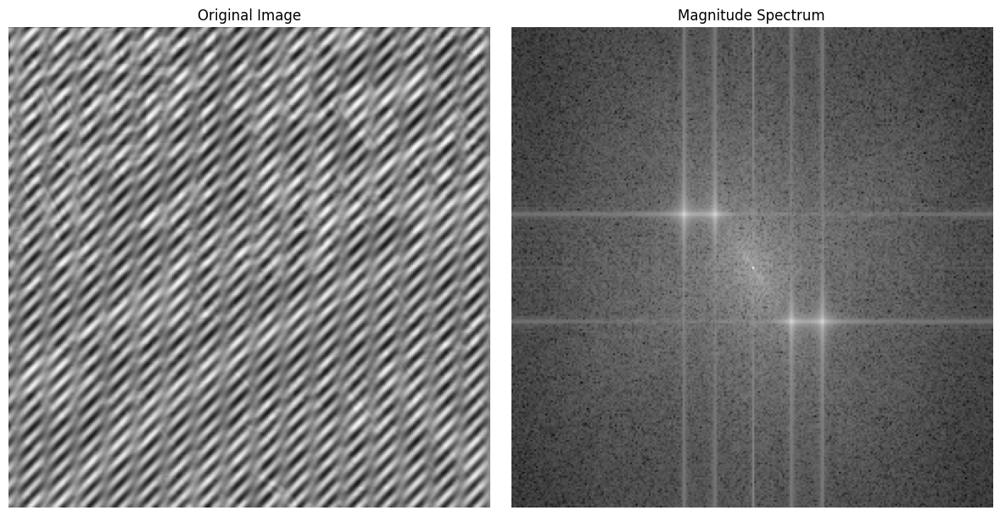

In [10]:
# Read the image
img_path = 'Image\\YmW3f.png'
img = cv2.imread(img_path, 0)

# Compute the FFT and magnitude spectrum
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift))

# Plot the image and its magnitude spectrum
plt.figure(figsize=(12, 6))

plt.subplot(121)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum')
plt.axis('off')

plt.tight_layout()
plt.show()

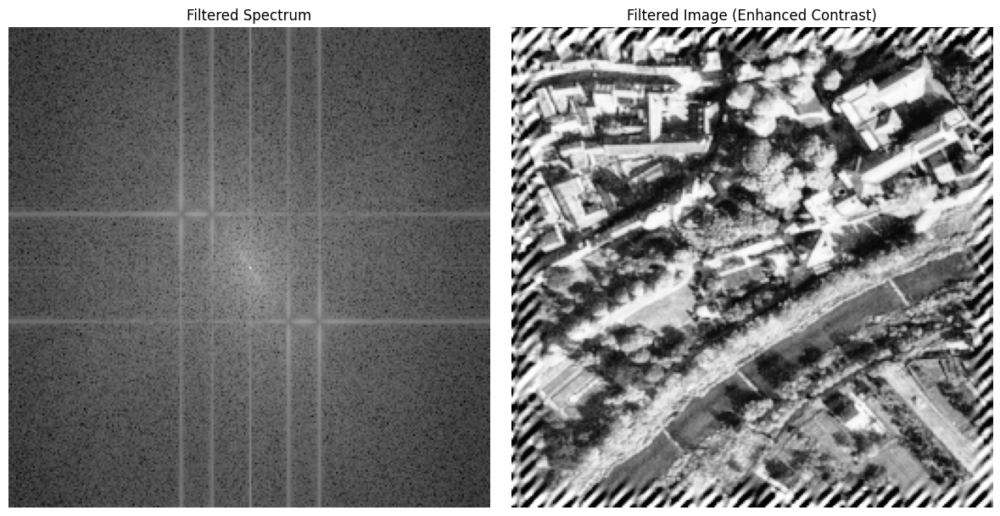

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def norm_img(img):
    return (img - np.min(img)) / (np.max(img) - np.min(img))

def show_spec(img):
    spectrum = norm_img(np.log(np.abs(img) + 1.0001))
    plt.imshow(spectrum, cmap='gray')

def gNotch(v, mu, cov):
    diff = v - mu[:, np.newaxis]
    return 1 - np.exp(-0.5 * np.sum(diff * (np.linalg.inv(cov) @ diff), axis=0))

f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
m, n = fshift.shape

cx, cy = 129, 129
wx1, wx2 = 149.5 - cx, 165.5 - cx
wy = 157.5 - cy
sigma = 5

filt = np.ones((m, n))

y, x = np.meshgrid(np.arange(1, n+1), np.arange(1, m+1))
X = np.vstack((y.ravel(), x.ravel()))

coords = [
    [cx + wx1, cy + wy],
    [cx + wx2, cy + wy],
    [cx - wx1, cy - wy],
    [cx - wx2, cy - wy]
]

for coord in coords:
    filt *= gNotch(X, np.array(coord), np.eye(2) * sigma**2).reshape(m, n)

fshift_filtered = fshift * filt

ifft_ = np.fft.ifft2(np.fft.ifftshift(fshift_filtered))
img_res = norm_img(np.abs(ifft_))

# Enhance contrast using histogram equalization
img_res_enhanced = cv2.equalizeHist((img_res * 255).astype(np.uint8))

plt.figure(figsize=(12, 6))

plt.subplot(121)
show_spec(fshift_filtered)
plt.title('Filtered Spectrum')
plt.axis('off')

plt.subplot(122)
plt.imshow(img_res_enhanced, cmap='gray')
plt.title('Filtered Image (Enhanced Contrast)')
plt.axis('off')

plt.tight_layout()
plt.show()

Reference:

- https://stackoverflow.com/questions/65483030/notch-reject-filtering-in-python
- https://stackoverflow.com/questions/29235421/find-proper-notch-filter-to-remove-pattern-from-image